In [ ]:
from google.colab import files, drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
import os

#!pip install pytorch_pretrained_bert==0.4.0
os.chdir("/content/gdrive/My Drive/KorBERT")

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving labeled_new_0831_1003.xlsx to labeled_new_0831_1003 (3).xlsx


In [ ]:
import pandas as pd
df = pd.read_excel("labeled_new_0831_1003.xlsx")

In [ ]:
import re
from sklearn.metrics import roc_auc_score, accuracy_score
from keras import regularizers
import numpy as np
from keras import optimizers

In [ ]:
def cleaned_text(text):
    text = text.replace('\\r',' ')
    text = text.replace('\\n','')
    _filter = re.compile('[^가-힣 0-9 a-z A-Z \@ \( \) \. \, \' \" \! \?]+')
    text = _filter.sub('', text)
    for i in range(2,20):
        text = text.replace(' '*i,' ')
    return text
df['content'] = df['content'].apply(lambda x : cleaned_text(x))

In [ ]:
import collections       # OrderedDict를 위해 호출
import re                # 정규표현식
import unicodedata       # 한국어 정준분해 및 문자열 확인
import six               # Python version 체크
import tensorflow as tf  # Tensorflow 파일 불러오기 및 logging
import urllib3
import json

In [ ]:
vocab_file = 'vocab.korean_morp.list'
#api_key = 'c149fccd-6639-4026-9fb8-cec175ff934c'

#api_key = 'f3639d57-7635-4bd9-93b0-6eae550ab90e'
api_key = '86770177-8cd5-4c5d-823c-85bd2b0e495e'

In [ ]:
def do_lang ( openapi_key, text ) :
    openApiURL = "http://aiopen.etri.re.kr:8000/WiseNLU"
	 
    requestJson = { "access_key": openapi_key, "argument": { "text": text, "analysis_code": "morp" } }
	 
    http = urllib3.PoolManager()
    response = http.request( "POST", openApiURL, headers={"Content-Type": "application/json; charset=UTF-8"}, body=json.dumps(requestJson))
    
    json_data = json.loads(response.data.decode('utf-8'))
    json_result = json_data["result"]
    
    if json_result == -1:
        json_reason = json_data["reason"]
        if "Invalid Access Key" in json_reason:
            logger.info(json_reason)
            logger.info("Please check the openapi access key.")
            sys.exit()
        return "openapi error - " + json_reason      
    else:
        json_data = json.loads(response.data.decode('utf-8'))
    
        json_return_obj = json_data["return_object"]
        
        return_result = ""
        json_sentence = json_return_obj["sentence"]
        for json_morp in json_sentence:                        
            for morp in json_morp["morp"]:
                return_result = return_result+str(morp["lemma"])+"/"+str(morp["type"])+" "

        return return_result

In [ ]:
from tokenization_morp import FullTokenizer

In [ ]:
# FullTokenizer
ftk = FullTokenizer(vocab_file, do_lower_case=False)

NameError: ignored

In [ ]:
def convert_to_unicode(text):
    # Python version이 3.x일 때,
    # type(text)이 `bytes`일 경우, utf-8로 변환
    if six.PY3:
        if isinstance(text, str):
            return text
        elif isinstance(text, bytes):
            return text.decode("utf-8", "ignore")
        else:
            raise ValueError("Unsupported string type: %s" % (type(text)))
    # Python version이 2.x일 때,
    # type(text)이 `str`일 경우, utf-8로 변환
    elif six.PY2:
        if isinstance(text, str):
            return text.decode("utf-8", "ignore")
        elif isinstance(text, unicode):
            return text
        else:
            raise ValueError("Unsupported string type: %s" % (type(text)))
    # Python 3.x, 2.x만 허용!
    else:
        raise ValueError("Not running on Python2 or Python 3?")
        
        
def _load_vocab(vocab_file):
    # 단어 사전을 저장할 OrderedDict 객체 생성
    vocab = collections.OrderedDict()
    index = 0
    with tf.io.gfile.GFile(vocab_file, 'r') as reader:
        while True:
            # Binary Text를 unicode(utf-8)로 decode.
            token = convert_to_unicode(reader.readline())
            if not token: break
            if ((token.find('n_iters=') == 0) or
                (token.find('max_length=') == 0)):
                continue
            token = token.split('\t')[0]
            token = token.strip()
            # 토큰과 해당 index를 기록
            vocab[token] = index
            index += 1
    return vocab

In [ ]:
morph_vocab = _load_vocab(vocab_file)

In [ ]:
from tqdm import tqdm

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train, test = train_test_split(df, test_size=0.1, random_state=0)

In [ ]:
test.shape

(101, 16)

In [ ]:
len(train['content1'][0])

1150

In [ ]:
tk_tr_ls = []
ipt_tr_ls = []

for content in tqdm(train['content1']):
    text = do_lang(api_key, content)
    split_tokens = ftk.tokenize(text)
    tokens = ["[CLS]"] + split_tokens + ["[SEP]"]
    tk_tr_ls.append(tokens)
    input_ids = [morph_vocab[token] for token in tokens]
    ipt_tr_ls.append(input_ids)

100%|██████████| 902/902 [06:28<00:00,  2.32it/s]


In [ ]:
tk_ts_ls = []
ipt_ts_ls = []

for content in tqdm(test['content1']):
    text = do_lang(api_key, content)
    split_tokens = ftk.tokenize(text)
    tokens = ["[CLS]"] + split_tokens + ["[SEP]"]
    tk_ts_ls.append(tokens)
    input_ids = [morph_vocab[token] for token in tokens]
    ipt_ts_ls.append(input_ids)

100%|██████████| 101/101 [01:11<00:00,  1.42it/s]


In [ ]:
tk_tr_ls

[['[CLS]',
  '대구/NNP_',
  'FC/SL_',
  '골/NNG_',
  '키퍼/NNG_',
  '조현',
  '우/NNP_',
  '(/SS_',
  '오른쪽/NNG_',
  ')/SS_',
  '가/JKS_',
  '인천/NNP_',
  '의/JKG_',
  '프리/NNG_',
  '킥/NNG_',
  '을/JKO_',
  '막/VV_',
  '기/ETN_',
  '위하/VV_',
  '어/EC_',
  '준비/NNG_',
  '하/XSV_',
  '고/EC_',
  '있/VX_',
  '다/EF_',
  './SF_',
  '대구/NNP_',
  'FC/SL_',
  '가/JKS_',
  '스',
  '플',
  '릿/NNG_',
  '라운드/NNG_',
  '를/JKO_',
  '승리/NNG_',
  '로/JKB_',
  '장식/NNG_',
  '하/XSV_',
  '며/EC_',
  '2/SN_',
  '부/NNB_',
  '리그/NNG_',
  '로/JKB_',
  '자동/NNG_',
  '강등/NNG_',
  '에서/JKB_',
  '벗어나/VV_',
  '았/EP_',
  '다/EF_',
  './SF_',
  '대구/NNP_',
  '는/JX_',
  '28/SN_',
  '일/NNB_',
  '오후/NNG_',
  '2/SN_',
  '시/NNB_',
  '인천',
  '축구',
  '전',
  '용',
  '경기',
  '장/NNP_',
  '에서/JKB_',
  '열리/VV_',
  'ㄴ/ETM_',
  'K',
  'E',
  'B/SL_',
  '하나',
  '은행/NNP_',
  'K/SL_',
  '리그/NNG_',
  '1/SN_',
  '2018/SN_',
  '34/SN_',
  '라운드/NNG_',
  '경기/NNG_',
  '에서/JKB_',
  '10/SN_',
  '승리/NNG_',
  '를/JKO_',
  '거두/VV_',
  '었/EP_',
  '다/EF_',
  './SF_',
  '이/NP_',


In [ ]:
test['content1']

894    사천 4곳창원 3곳함안 2곳 등. 용지 수급 안정일자리 창출 기대. . 경남도가 1...
605    대구경북이 전국체전 목표 달성을 향해 순항하고 있다. 전북 익산 등에서 개최되고 있...
298    신재민 전 기재부 사무관 주장 관련. 특별검사 도입국회 기재위 소집 요구. 나경원 ...
356    내일 오후 4시 적진서 킥오프. 지난 경기 아쉬운 시즌 첫 패배. 반등 기회 잡을 ...
571    한국 축구와 야구 대표팀이 2018 자카르타아시안게임에서 동반 우승하며 금메달과 함...
                             ...                        
911    화성시의회가 제184회 제1차 정례회 기간 중 현장방문을 잇달아 가졌다.  기획행정...
108    도내 지자체 한파 편의시설 설치. 합천거창, 버스터미널승강장에. 탄소 열선 내장된 ...
494    이선호 기자. 1월 경기북부지역 중소기업 업황 전망이 하락한 것으로 나타났다. 1일...
824    출처  유튜브 '알릴레오' 채널 영상캡처. . 6월 3일 국민대 변상욱 교수의 사회...
787    전남해양수산기술원, 치어 분양 보급사업 본격 추진. . 급감한 참조기 생산량을 늘리...
Name: content1, Length: 101, dtype: object

In [ ]:
len(tk_tr_ls[1])

399

In [ ]:
maxlen1 = 0
for ipt in ipt_tr_ls:
    if len(ipt) > maxlen1:
        maxlen1 = len(ipt)

maxlen2 = 0
for ipt in ipt_ts_ls:
    if len(ipt) > maxlen2:
        maxlen2 = len(ipt)

if maxlen1 > maxlen2:
    maxlen = maxlen1
else:
    maxlen = maxlen2

print(maxlen)
print(maxlen1)
print(maxlen2)

1214
1214
1167


In [ ]:
from keras.preprocessing.sequence import pad_sequences
x_train = pad_sequences(ipt_tr_ls, maxlen=maxlen)
x_test = pad_sequences(ipt_ts_ls, maxlen=maxlen)

In [ ]:
ipt_ts_ls

[[2,
  174,
  1756,
  82,
  452,
  8006,
  63,
  10296,
  1705,
  306,
  54,
  452,
  51,
  7,
  831,
  289,
  5252,
  1475,
  130,
  364,
  5180,
  634,
  7,
  7,
  380,
  9602,
  24,
  563,
  154,
  1265,
  3379,
  19,
  63,
  44,
  3130,
  1957,
  9,
  12,
  8,
  7,
  1265,
  831,
  289,
  5252,
  1475,
  46,
  130,
  364,
  5180,
  1163,
  51,
  16,
  634,
  32,
  41,
  7,
  8934,
  3201,
  1957,
  9,
  10,
  468,
  755,
  21,
  174,
  1756,
  831,
  3133,
  791,
  1265,
  3379,
  51,
  563,
  452,
  15,
  53,
  2077,
  2827,
  21,
  595,
  214,
  85,
  785,
  15,
  8,
  7,
  174,
  1756,
  16,
  82,
  452,
  29,
  831,
  1012,
  854,
  381,
  174,
  1756,
  4040,
  3913,
  791,
  468,
  755,
  30,
  28,
  229,
  144,
  23,
  17,
  8006,
  16,
  63,
  452,
  29,
  1026,
  270,
  1978,
  468,
  201,
  761,
  791,
  468,
  755,
  30,
  17,
  1705,
  2075,
  16,
  54,
  452,
  29,
  193,
  1256,
  250,
  34,
  791,
  468,
  755,
  30,
  935,
  811,
  15,
  8,
  7,
  194,
  270,
  1961

In [ ]:
x_test.shape

(101, 1214)

In [ ]:
#np.savez('x_train.npz', emb=x_train)

import numpy as np
m
x_train_111 = np.load('x_train.npz')

x_train = x_train_111['emb']

print(x_train[0])

[0 0 0 ... 7 7 3]


In [ ]:
x_train_111['emb']

array([[   0,    0,    0, ...,    7,    7,    3],
       [   0,    0,    0, ...,    7,    7,    3],
       [   0,    0,    0, ...,  196, 2159,    3],
       ...,
       [   0,    0,    0, ...,    8,    7,    3],
       [   0,    0,    0, ...,    7,    7,    3],
       [   0,    0,    0, ...,    8,    7,    3]], dtype=int32)

In [ ]:
#np.savez('x_test.npz', emb=x_test)

import numpy as np

x_test_111 = np.load('x_test.npz')

x_test = x_test_111['emb']

x_test

array([[   0,    0,    0, ...,  158,    7,    3],
       [   0,    0,    0, ...,    7,    7,    3],
       [   0,    0,    0, ...,  158,    7,    3],
       ...,
       [   0,    0,    0, ...,  372,    7,    3],
       [   0,    0,    0, ..., 1755, 2419,    3],
       [   0,    0,    0, ...,    7,    7,    3]], dtype=int32)

In [ ]:
y_train = train['quality']
y_test = test['quality']

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM
# 텍스트 데이터는 거의 embedding은 필수

In [ ]:
max_features=100000

In [ ]:
from keras.layers import Bidirectional

In [ ]:
model = Sequential()
model.add(Embedding(max_features+1, 32, input_length=maxlen))
model.add(Bidirectional(LSTM(32)))
#model.add(LSTM(32, return_sequences=True)) # many to many로 하고 싶으면 True로 하면 됨
# 532가 들어와서 다시 532개를 통과시키는 것. 32개말고 통과안된 애들은 안된 그대로 올라가고 32개는 통과된 상태로 올라감
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_29 (Embedding)     (None, 1214, 32)          3200032   
_________________________________________________________________
bidirectional_10 (Bidirectio (None, 64)                16640     
_________________________________________________________________
dense_119 (Dense)            (None, 1)                 65        
Total params: 3,216,737
Trainable params: 3,216,737
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
23/23 [==============================] - 21s 920ms/step - loss: 0.6942 - acc: 0.4965 - val_loss: 0.6922 - val_acc: 0.5138
Epoch 2/10
23/23 [==============================] - 20s 890ms/step - loss: 0.6892 - acc: 0.6172 - val_loss: 0.6900 - val_acc: 0.5470
Epoch 3/10
23/23 [==============================] - 20s 891ms/step - loss: 0.6674 - acc: 0.6644 - val_loss: 0.6872 - val_acc: 0.5746
Epoch 4/10
23/23 [==============================] - 21s 893ms/step - loss: 0.5631 - acc: 0.7656 - val_loss: 0.6984 - val_acc: 0.5912
Epoch 5/10
23/23 [==============================] - 20s 889ms/step - loss: 0.3971 - acc: 0.8544 - val_loss: 0.8690 - val_acc: 0.5525
Epoch 6/10
23/23 [==============================] - 21s 897ms/step - loss: 0.3255 - acc: 0.8724 - val_loss: 0.8147 - val_acc: 0.6022
Epoch 7/10
23/23 [==============================] - 21s 894ms/step - loss: 0.1923 - acc: 0.9376 - val_loss: 1.0244 - val_acc: 0.5635
Epoch 8/10
23/23 [==============================] - 20s 888ms/step - 

In [ ]:
pred = model.predict_classes(x_test)
accuracy_score(y_test, pred)

0.5346534653465347

In [ ]:
pred1 = model.predict_classes(x_test)
accuracy_score(y_test, pred1)

0.5742574257425742

In [ ]:
from keras.layers.core import Dropout

In [ ]:
model1 = Sequential()
model1.add(Embedding(max_features+1, 64, input_length=maxlen))
model1.add(Bidirectional(LSTM(64)))
#model1.add(LSTM(32))
model1.add(Dense(32, activation='relu'))
model1.add(Dense(16, activation='relu'))
model1.add(Dense(16, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model1.add(Dense(8, activation='relu'))
model1.add(Dense(4, activation='relu'))
#model1.add(LSTM(32, return_sequences=True)) # many to many로 하고 싶으면 True로 하면 됨
# 532가 들어와서 다시 532개를 통과시키는 것. 32개말고 통과안된 애들은 안된 그대로 올라가고 32개는 통과된 상태로 올라감
model1.add(Dense(1, activation='sigmoid'))
model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model1.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_30 (Embedding)     (None, 1214, 64)          6400064   
_________________________________________________________________
bidirectional_11 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_120 (Dense)            (None, 32)                4128      
_________________________________________________________________
dense_121 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_122 (Dense)            (None, 16)                272       
_________________________________________________________________
dense_123 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_124 (Dense)            (None, 4)               

In [ ]:
history1 = model1.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 35s 1s/step - loss: 0.7081 - acc: 0.4698 - val_loss: 0.7067 - val_acc: 0.4615
Epoch 2/10
26/26 [==============================] - 35s 1s/step - loss: 0.7055 - acc: 0.4784 - val_loss: 0.7043 - val_acc: 0.4615
Epoch 3/10
26/26 [==============================] - 34s 1s/step - loss: 0.7034 - acc: 0.5031 - val_loss: 0.7025 - val_acc: 0.4615
Epoch 4/10
26/26 [==============================] - 34s 1s/step - loss: 0.7015 - acc: 0.5031 - val_loss: 0.7008 - val_acc: 0.4615
Epoch 5/10
26/26 [==============================] - 34s 1s/step - loss: 0.7000 - acc: 0.5031 - val_loss: 0.6994 - val_acc: 0.4615
Epoch 6/10
26/26 [==============================] - 35s 1s/step - loss: 0.6988 - acc: 0.5031 - val_loss: 0.6983 - val_acc: 0.4615
Epoch 7/10
26/26 [==============================] - 35s 1s/step - loss: 0.6977 - acc: 0.5031 - val_loss: 0.6974 - val_acc: 0.4615
Epoch 8/10
26/26 [==============================] - 37s 1s/step - loss: 0.6968 - acc: 0.50

In [ ]:
pred1 = model1.predict_classes(x_test)
accuracy_score(y_test, pred1)

0.5346534653465347

In [ ]:
pred1 = model1.predict_classes(x_test)
accuracy_score(y_test, pred1)

0.49504950495049505

In [ ]:
maxlen = 1214

In [ ]:
model2 = Sequential()
model2.add(Embedding(max_features+1, 64, input_length=maxlen))
model2.add(Bidirectional(LSTM(64)))
model2.add(Dense(64, activation='relu'))
model2.add(Dense(32, activation='relu'))
model2.add(Dense(16, activation='relu'))
model2.add(Dense(4, activation='relu'))
model2.add(Dense(1, activation='sigmoid'))
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model2.summary()

Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, 1214, 64)          6400064   
_________________________________________________________________
bidirectional_12 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_126 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_127 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_128 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_129 (Dense)            (None, 4)                 68        
_________________________________________________________________
dense_130 (Dense)            (None, 1)               

In [ ]:
history = model2.fit(x_train, y_train, epochs=10, batch_size=64, validation_split=0.2)

Epoch 1/10
12/12 [==============================] - 21s 2s/step - loss: 0.6944 - acc: 0.5007 - val_loss: 0.6928 - val_acc: 0.4917
Epoch 2/10
12/12 [==============================] - 21s 2s/step - loss: 0.6917 - acc: 0.5173 - val_loss: 0.6922 - val_acc: 0.4917
Epoch 3/10
12/12 [==============================] - 21s 2s/step - loss: 0.6797 - acc: 0.5784 - val_loss: 0.6886 - val_acc: 0.5359
Epoch 4/10
12/12 [==============================] - 21s 2s/step - loss: 0.6262 - acc: 0.7074 - val_loss: 0.7228 - val_acc: 0.5635
Epoch 5/10
12/12 [==============================] - 21s 2s/step - loss: 0.5411 - acc: 0.7670 - val_loss: 0.7791 - val_acc: 0.5967
Epoch 6/10
12/12 [==============================] - 21s 2s/step - loss: 0.4932 - acc: 0.8072 - val_loss: 0.8096 - val_acc: 0.5249
Epoch 7/10
12/12 [==============================] - 21s 2s/step - loss: 0.3671 - acc: 0.8474 - val_loss: 1.0232 - val_acc: 0.5138
Epoch 8/10
12/12 [==============================] - 21s 2s/step - loss: 0.2797 - acc: 0.90

In [ ]:
pred1 = model1.predict_classes(x_test)
accuracy_score(y_test, pred1)

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


0.6039603960396039

In [ ]:
pred2 = model2.predict_classes(x_test) # 양방향
accuracy_score(y_test, pred2)

0.6039603960396039

In [ ]:
model2_1 = Sequential()
model2_1.add(Embedding(max_features+1, 64, input_length=maxlen))
model2_1.add(Bidirectional(LSTM(64)))
model2_1.add(Dense(64, activation='relu'))
model2_1.add(Dense(32, activation='relu'))
model2_1.add(Dense(16, activation='relu'))
model2_1.add(Dense(4, activation='relu'))
model2_1.add(Dense(1, activation='sigmoid'))
model2_1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['acc'])
model2_1.summary()

Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_32 (Embedding)     (None, 1214, 64)          6400064   
_________________________________________________________________
bidirectional_13 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_131 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_132 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_133 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_134 (Dense)            (None, 4)                 68        
_________________________________________________________________
dense_135 (Dense)            (None, 1)               

In [ ]:
history_1 = model2_1.fit(x_train, y_train, epochs=20, batch_size=64, validation_split=0.1)

Epoch 1/20
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.4969 - val_loss: 0.6932 - val_acc: 0.4615
Epoch 2/20
13/13 [==============================] - 23s 2s/step - loss: 0.6930 - acc: 0.5068 - val_loss: 0.6931 - val_acc: 0.4835
Epoch 3/20
13/13 [==============================] - 22s 2s/step - loss: 0.6929 - acc: 0.5105 - val_loss: 0.6932 - val_acc: 0.4945
Epoch 4/20
13/13 [==============================] - 22s 2s/step - loss: 0.6928 - acc: 0.5228 - val_loss: 0.6930 - val_acc: 0.4945
Epoch 5/20
13/13 [==============================] - 22s 2s/step - loss: 0.6927 - acc: 0.5647 - val_loss: 0.6929 - val_acc: 0.4725
Epoch 6/20
13/13 [==============================] - 22s 2s/step - loss: 0.6923 - acc: 0.5956 - val_loss: 0.6928 - val_acc: 0.4945
Epoch 7/20
13/13 [==============================] - 22s 2s/step - loss: 0.6919 - acc: 0.6042 - val_loss: 0.6922 - val_acc: 0.5495
Epoch 8/20
13/13 [==============================] - 22s 2s/step - loss: 0.6911 - acc: 0.61

In [ ]:
pred2_1 = model2_1.predict_classes(x_test)
accuracy_score(y_test, pred2_1)

0.5643564356435643

In [ ]:
model3 = Sequential()
model3.add(Embedding(max_features+1, 64, input_length=maxlen))
model3.add(Bidirectional(LSTM(64)))
model3.add(Dense(64, activation='relu'))
model3.add(Dense(32, activation='relu'))
model3.add(Dense(16, activation='relu'))
model3.add(Dense(4, activation='relu'))
model3.add(Dense(1, activation='sigmoid'))
model3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.00001), loss='binary_crossentropy', metrics=['acc'])
model3.summary()

Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_33 (Embedding)     (None, 1214, 64)          6400064   
_________________________________________________________________
bidirectional_14 (Bidirectio (None, 128)               66048     
_________________________________________________________________
dense_136 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_137 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_138 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_139 (Dense)            (None, 4)                 68        
_________________________________________________________________
dense_140 (Dense)            (None, 1)               

In [ ]:
history = model3.fit(x_train, y_train, epochs=30, batch_size=64, validation_split=0.1)

Epoch 1/30
13/13 [==============================] - 23s 2s/step - loss: 0.6932 - acc: 0.5031 - val_loss: 0.6934 - val_acc: 0.4615
Epoch 2/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 3/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 4/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 5/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 6/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 7/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.5031 - val_loss: 0.6935 - val_acc: 0.4615
Epoch 8/30
13/13 [==============================] - 23s 2s/step - loss: 0.6931 - acc: 0.50

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6039603960396039

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.49504950495049505

In [ ]:
model4 = Sequential()
model4.add(Embedding(max_features+1, 32, input_length=maxlen))
model4.add(Bidirectional(LSTM(32)))
model4.add(Dense(32, activation='relu'))
model4.add(Dense(16, activation='relu'))
model4.add(Dense(4, activation='relu'))
model4.add(Dense(1, activation='sigmoid'))
model4.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss='binary_crossentropy', metrics=['acc'])
model4.summary()

Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_34 (Embedding)     (None, 1214, 32)          3200032   
_________________________________________________________________
bidirectional_15 (Bidirectio (None, 64)                16640     
_________________________________________________________________
dense_141 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_142 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_143 (Dense)            (None, 4)                 68        
_________________________________________________________________
dense_144 (Dense)            (None, 1)                 5         
Total params: 3,219,353
Trainable params: 3,219,353
Non-trainable params: 0
___________________________________________

In [ ]:
history = model4.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 24s 932ms/step - loss: 0.6935 - acc: 0.4969 - val_loss: 0.6931 - val_acc: 0.5385
Epoch 2/20
26/26 [==============================] - 22s 863ms/step - loss: 0.6931 - acc: 0.4969 - val_loss: 0.6930 - val_acc: 0.5385
Epoch 3/20
26/26 [==============================] - 23s 866ms/step - loss: 0.6929 - acc: 0.4969 - val_loss: 0.6931 - val_acc: 0.5385
Epoch 4/20
26/26 [==============================] - 23s 876ms/step - loss: 0.6927 - acc: 0.4969 - val_loss: 0.6933 - val_acc: 0.5385
Epoch 5/20
26/26 [==============================] - 23s 868ms/step - loss: 0.6925 - acc: 0.4969 - val_loss: 0.6931 - val_acc: 0.5385
Epoch 6/20
26/26 [==============================] - 23s 870ms/step - loss: 0.6922 - acc: 0.5018 - val_loss: 0.6930 - val_acc: 0.5385
Epoch 7/20
26/26 [==============================] - 23s 866ms/step - loss: 0.6918 - acc: 0.5068 - val_loss: 0.6927 - val_acc: 0.5385
Epoch 8/20
26/26 [==============================] - 22s 864ms/step - 

In [ ]:
pred4 = model4.predict_classes(x_test)
accuracy_score(y_test, pred4)

0.693069306930693

In [ ]:
pred4 = model4.predict_classes(x_test)
accuracy_score(y_test, pred4)

0.5346534653465347

In [ ]:
from keras.models import load_model

model4.save('model4.h5')

In [ ]:
model = load_model('model4.h5')

### 영화 리뷰 데이터로 초기 임베딩값으로 선정

#### embedding weight 만들기

In [ ]:
import pandas as pd

tr = pd.read_csv('train.csv')
te = pd.read_csv('test.csv')

In [ ]:
cols = ['rating','nn_token']
tr = tr[cols]
cols = ['id','nn_token']
te = te[cols]
tr.head()

In [ ]:
labels = tr.rating.values
texts = list(pd.concat([tr.nn_token, te.nn_token]))

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
max_words = 10000
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(texts)

seq = tokenizer.texts_to_sequences(texts) # 문자열을 정수 인덱스의 리스트로 변환
maxlen = max(len(x) for x in seq)

word2idx = tokenizer.word_index # 계산된 단어의 인덱싱
word2idx[0] = 'PAD'
idx2word = {j:i for i,j in word2idx.items()}

seq = pad_sequences(seq, maxlen=maxlen)
tr_seq = seq[:len(labels)]
te_seq = seq[len(labels):]

In [ ]:
len(seq[0])

In [ ]:
maxlen

In [ ]:
from sklearn.model_selection import train_test_split
x_train11, x_test11, y_train11, y_test11 = train_test_split(tr_seq, labels, test_size=0.2, stratify=labels)

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, GRU, Dense, LSTM
from keras import layers

In [2]:
#np.savez('x_train11.npz', emb=x_train11)

import numpy as np

x_train_mov = np.load('x_train11.npz')

x_train11 = x_train_mov['emb']

FileNotFoundError: ignored

In [ ]:
#np.savez('x_test11.npz', emb=x_test11)

import numpy as np

x_test_mov = np.load('x_test11.npz')

x_test11 = x_test_mov['emb']

In [ ]:
np.savez('y_train11.npz', emb=y_train11)

import numpy as np

y_train_mov = np.load('y_train11.npz')

y_train11 = y_train_mov['emb']

In [ ]:
#np.savez('y_test11.npz', emb=y_test11)

import numpy as np

y_test_mov = np.load('y_test11.npz')

y_test11 = y_test_mov['emb']

In [ ]:
from google.colab import files

uploaded = files.upload()

In [ ]:
NUM_WORD = max_features + 1
NUM_WORD

In [ ]:
emb1 = tf.keras.layers.Embedding(input_dim=NUM_WORD, output_dim=32) # 단어마다 8개의 임베딩 숫자가 생김
lm = tf.keras.Sequential([
    emb1,
    tf.keras.layers.GlobalAveragePooling1D(), # 평균내서 8개의 숫자로 줄여줌 => word2vec에서 사용
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1) # activation 생략
    
])

In [ ]:
lm.compile(
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
lm.fit(x_train11, y_train11, epochs=1)
# 다음에 나올 수 있는 단어가 2001종류인데 8%인데 그렇게 나쁘다고 볼 수 없음

In [ ]:
lm.summary()

In [ ]:
e = emb1.embeddings.numpy()
e

In [ ]:
np.savez('word-emb1.npz', emb=e)

### accuracy 0.69 model

In [ ]:
import numpy as np

z = np.load('word-emb1.npz')

e = z['emb']

e

array([[ 0.00123347,  0.01702357,  0.10993671, ..., -0.0044701 ,
        -0.00649228,  0.08331141],
       [ 0.0086521 ,  0.03148787,  0.09269577, ..., -0.01083259,
        -0.02572022,  0.11290794],
       [ 0.01882948, -0.03842232,  0.04793525, ..., -0.01183675,
         0.07250933,  0.03755685],
       ...,
       [-0.03553583, -0.0074547 ,  0.00910028, ..., -0.01113722,
         0.02055839,  0.04776439],
       [-0.00688708, -0.01976826, -0.03682473, ...,  0.01648604,
         0.04819519,  0.01138493],
       [ 0.01278998,  0.01922304, -0.02472761, ..., -0.02988487,
         0.03721834,  0.01023837]], dtype=float32)

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_2 ( (None, 32)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_9 (Dense)              (None, 16)                528       
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
____________________________________________

In [ ]:
model_1.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history_1 = model_1.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 40ms/step - loss: 0.6935 - accuracy: 0.4969 - val_loss: 0.6925 - val_accuracy: 0.5385
Epoch 2/10
26/26 [==============================] - 1s 35ms/step - loss: 0.6931 - accuracy: 0.4969 - val_loss: 0.6925 - val_accuracy: 0.5385
Epoch 3/10
26/26 [==============================] - 1s 34ms/step - loss: 0.6930 - accuracy: 0.4969 - val_loss: 0.6924 - val_accuracy: 0.5495
Epoch 4/10
26/26 [==============================] - 1s 34ms/step - loss: 0.6927 - accuracy: 0.5117 - val_loss: 0.6923 - val_accuracy: 0.5495
Epoch 5/10
26/26 [==============================] - 1s 34ms/step - loss: 0.6922 - accuracy: 0.5129 - val_loss: 0.6917 - val_accuracy: 0.5604
Epoch 6/10
26/26 [==============================] - 1s 34ms/step - loss: 0.6908 - accuracy: 0.5808 - val_loss: 0.6895 - val_accuracy: 0.7033
Epoch 7/10
26/26 [==============================] - 1s 35ms/step - loss: 0.6836 - accuracy: 0.6387 - val_loss: 0.6783 - val_accuracy: 0.5495
Epoch 8/10
26

In [ ]:
pred_1 = model_1.predict_classes(x_test)
accuracy_score(y_test, pred_1)

0.693069306930693

In [ ]:
0.693069306930693

- batch_size=16

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_1 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_1.summary()

Model: "sequential_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_26 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_23  (None, 32)                0         
_________________________________________________________________
dense_107 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_108 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_109 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_110 (Dense)            (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
___________________________________________

In [ ]:
model_1_1.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history_1_1 = model_1_1.fit(x_train, y_train, epochs=10, batch_size=16, validation_split=0.1)

Epoch 1/10
51/51 [==============================] - 3s 51ms/step - loss: 0.6934 - accuracy: 0.5031 - val_loss: 0.6937 - val_accuracy: 0.4615
Epoch 2/10
51/51 [==============================] - 2s 36ms/step - loss: 0.6922 - accuracy: 0.5068 - val_loss: 0.6909 - val_accuracy: 0.6593
Epoch 3/10
51/51 [==============================] - 2s 36ms/step - loss: 0.6879 - accuracy: 0.6030 - val_loss: 0.6827 - val_accuracy: 0.6044
Epoch 4/10
51/51 [==============================] - 2s 36ms/step - loss: 0.6697 - accuracy: 0.6054 - val_loss: 0.6646 - val_accuracy: 0.6264
Epoch 5/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6221 - accuracy: 0.7374 - val_loss: 0.6240 - val_accuracy: 0.6703
Epoch 6/10
51/51 [==============================] - 2s 36ms/step - loss: 0.5012 - accuracy: 0.8508 - val_loss: 0.5873 - val_accuracy: 0.6703
Epoch 7/10
51/51 [==============================] - 2s 36ms/step - loss: 0.3380 - accuracy: 0.9088 - val_loss: 0.6709 - val_accuracy: 0.6593
Epoch 8/10
51

In [ ]:
#pred_1_1 = model_1_1.predict_classes(x_test)
accuracy_score(y_test, pred_1_1)

0.6336633663366337

- layer 32 추가

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_2 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_2.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_27 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_24  (None, 32)                0         
_________________________________________________________________
dense_111 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_112 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_113 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_114 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_115 (Dense)            (None, 1)               

In [ ]:
model_1_2.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history_1_1 = model_1_2.fit(x_train, y_train, epochs=10, batch_size=16, validation_split=0.1)

Epoch 1/10
51/51 [==============================] - 2s 39ms/step - loss: 0.6949 - accuracy: 0.5031 - val_loss: 0.6936 - val_accuracy: 0.4615
Epoch 2/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6933 - accuracy: 0.4969 - val_loss: 0.6931 - val_accuracy: 0.5385
Epoch 3/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6932 - accuracy: 0.4969 - val_loss: 0.6930 - val_accuracy: 0.5385
Epoch 4/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6932 - accuracy: 0.4932 - val_loss: 0.6933 - val_accuracy: 0.4615
Epoch 5/10
51/51 [==============================] - 2s 36ms/step - loss: 0.6932 - accuracy: 0.4784 - val_loss: 0.6931 - val_accuracy: 0.5385
Epoch 6/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6931 - accuracy: 0.5117 - val_loss: 0.6934 - val_accuracy: 0.4615
Epoch 7/10
51/51 [==============================] - 2s 37ms/step - loss: 0.6931 - accuracy: 0.5031 - val_loss: 0.6934 - val_accuracy: 0.4615
Epoch 8/10
51

In [ ]:
pred_1_2 = model_1_2.predict_classes(x_test)
accuracy_score(y_test, pred_1_2)

0.49504950495049505

- batch size 64

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_3 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_3.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_31 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_28  (None, 32)                0         
_________________________________________________________________
dense_130 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_131 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_132 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_133 (Dense)            (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
___________________________________________

In [ ]:
model_1_3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history_1_3 = model_1_3.fit(x_train, y_train, epochs=10, batch_size=64, validation_split=0.1)

Epoch 1/10
13/13 [==============================] - 1s 52ms/step - loss: 0.6934 - accuracy: 0.4673 - val_loss: 0.6921 - val_accuracy: 0.5385
Epoch 2/10
13/13 [==============================] - 1s 40ms/step - loss: 0.6928 - accuracy: 0.5142 - val_loss: 0.6925 - val_accuracy: 0.5604
Epoch 3/10
13/13 [==============================] - 1s 42ms/step - loss: 0.6919 - accuracy: 0.5697 - val_loss: 0.6922 - val_accuracy: 0.5165
Epoch 4/10
13/13 [==============================] - 1s 41ms/step - loss: 0.6909 - accuracy: 0.5623 - val_loss: 0.6913 - val_accuracy: 0.6154
Epoch 5/10
13/13 [==============================] - 1s 41ms/step - loss: 0.6896 - accuracy: 0.6301 - val_loss: 0.6893 - val_accuracy: 0.6703
Epoch 6/10
13/13 [==============================] - 1s 40ms/step - loss: 0.6861 - accuracy: 0.7053 - val_loss: 0.6858 - val_accuracy: 0.6154
Epoch 7/10
13/13 [==============================] - 1s 41ms/step - loss: 0.6800 - accuracy: 0.7238 - val_loss: 0.6828 - val_accuracy: 0.6813
Epoch 8/10
13

In [ ]:
pred_1_3 = model_1_3.predict_classes(x_test)
accuracy_score(y_test, pred_1_3)

0.6831683168316832

In [ ]:
e

array([[ 0.00123347,  0.01702357,  0.10993671, ..., -0.0044701 ,
        -0.00649228,  0.08331141],
       [ 0.0086521 ,  0.03148787,  0.09269577, ..., -0.01083259,
        -0.02572022,  0.11290794],
       [ 0.01882948, -0.03842232,  0.04793525, ..., -0.01183675,
         0.07250933,  0.03755685],
       ...,
       [-0.03553583, -0.0074547 ,  0.00910028, ..., -0.01113722,
         0.02055839,  0.04776439],
       [-0.00688708, -0.01976826, -0.03682473, ...,  0.01648604,
         0.04819519,  0.01138493],
       [ 0.01278998,  0.01922304, -0.02472761, ..., -0.02988487,
         0.03721834,  0.01023837]], dtype=float32)

In [ ]:
import tensorflow_addons as tfa

In [ ]:
NUM_WORD = max_features+1

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_3 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_3.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d (Gl (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_26 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_27 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_28 (Dense)             (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
____________________________________________

In [ ]:
model_1_3.compile(
    loss='binary_crossentropy',
    optimizer = tfa.optimizers.RectifiedAdam(lr=0.001),
    metrics=['accuracy']
)

In [ ]:
history_1_3 = model_1_3.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 1s 53ms/step - loss: 0.6932 - accuracy: 0.5203 - val_loss: 0.6941 - val_accuracy: 0.4505
Epoch 2/20
26/26 [==============================] - 1s 49ms/step - loss: 0.6931 - accuracy: 0.5154 - val_loss: 0.6943 - val_accuracy: 0.4505
Epoch 3/20
26/26 [==============================] - 1s 47ms/step - loss: 0.6931 - accuracy: 0.5018 - val_loss: 0.6943 - val_accuracy: 0.4615
Epoch 4/20
26/26 [==============================] - 1s 49ms/step - loss: 0.6929 - accuracy: 0.5068 - val_loss: 0.6941 - val_accuracy: 0.4505
Epoch 5/20
26/26 [==============================] - 1s 49ms/step - loss: 0.6929 - accuracy: 0.5031 - val_loss: 0.6941 - val_accuracy: 0.4615
Epoch 6/20
26/26 [==============================] - 1s 46ms/step - loss: 0.6927 - accuracy: 0.5327 - val_loss: 0.6939 - val_accuracy: 0.4615
Epoch 7/20
26/26 [==============================] - 1s 47ms/step - loss: 0.6928 - accuracy: 0.5487 - val_loss: 0.6935 - val_accuracy: 0.4835
Epoch 8/20
26

In [ ]:
pred_1_3 = model_1_3.predict_classes(x_test)
accuracy_score(y_test, pred_1_3)

0.6633663366336634

lr 0.0001 model

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_4 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_4.summary()

Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_34 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_31  (None, 32)                0         
_________________________________________________________________
dense_142 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_143 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_144 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_145 (Dense)            (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
___________________________________________

In [ ]:
model_1_4.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

In [ ]:
history_1_4 = model_1_4.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 43ms/step - loss: 0.0361 - accuracy: 0.9975 - val_loss: 1.0151 - val_accuracy: 0.6264
Epoch 2/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0341 - accuracy: 0.9975 - val_loss: 1.0296 - val_accuracy: 0.6264
Epoch 3/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0327 - accuracy: 0.9975 - val_loss: 1.0272 - val_accuracy: 0.6374
Epoch 4/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0307 - accuracy: 0.9975 - val_loss: 1.0429 - val_accuracy: 0.6374
Epoch 5/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0293 - accuracy: 0.9975 - val_loss: 1.0393 - val_accuracy: 0.6484
Epoch 6/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0285 - accuracy: 0.9975 - val_loss: 1.0254 - val_accuracy: 0.6374
Epoch 7/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0273 - accuracy: 0.9975 - val_loss: 1.0407 - val_accuracy: 0.6374
Epoch 8/10
26

In [ ]:
pred_1_4 = model_1_4.predict_classes(x_test)
accuracy_score(y_test, pred_1_4)

0.6336633663366337

lr 0.0005 model

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_5 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    #tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_5.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_4 ( (None, 32)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_43 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_44 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_45 (Dense)             (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
___________________________________________

In [ ]:
model_1_5.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    metrics=['accuracy']
)

In [ ]:
history_1_5 = model_1_5.fit(x_train, y_train, epochs=30, batch_size=32, validation_split=0.1)

Epoch 1/30
26/26 [==============================] - 1s 43ms/step - loss: 0.6932 - accuracy: 0.4969 - val_loss: 0.6929 - val_accuracy: 0.5385
Epoch 2/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6931 - accuracy: 0.4982 - val_loss: 0.6929 - val_accuracy: 0.5385
Epoch 3/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6931 - accuracy: 0.4969 - val_loss: 0.6929 - val_accuracy: 0.5385
Epoch 4/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6930 - accuracy: 0.4969 - val_loss: 0.6929 - val_accuracy: 0.5385
Epoch 5/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6929 - accuracy: 0.5290 - val_loss: 0.6930 - val_accuracy: 0.5385
Epoch 6/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6928 - accuracy: 0.5117 - val_loss: 0.6930 - val_accuracy: 0.5385
Epoch 7/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6927 - accuracy: 0.5549 - val_loss: 0.6931 - val_accuracy: 0.5604
Epoch 8/30
26

In [ ]:
pred_1_5 = model_1_5.predict_classes(x_test)
accuracy_score(y_test, pred_1_5)

0.6831683168316832

In [ ]:
accuracy_score(y_test, model_1_5.predict_classes(x_test))

0.6831683168316832

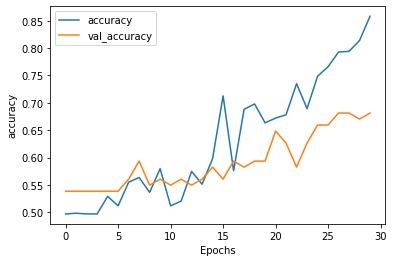

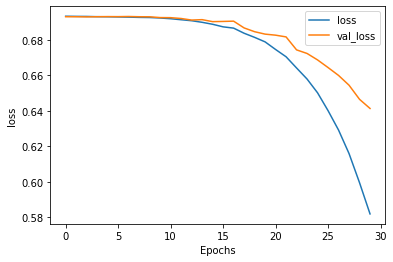

In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt

# history를 그래프로 그리기 위해 사용
def plot_graphs(history, metric):
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])
  plt.show()


  # 그래프 그리기
plot_graphs(history_1_5, 'accuracy')
plot_graphs(history_1_5, 'loss')

In [ ]:
from keras.models import load_model

model_1_5.save('model_1_5_real.h5')

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model_1_5_1 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    #tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model_1_5_1.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_10 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_5 ( (None, 32)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_47 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_48 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_49 (Dense)             (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
___________________________________________

In [ ]:
model_1_5_1.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    metrics=['accuracy']
)

In [ ]:
history_1_5_1 = model_1_5_1.fit(x_train, y_train, epochs=30, batch_size=32, validation_split=0.1)

Epoch 1/30
26/26 [==============================] - 1s 41ms/step - loss: 0.6932 - accuracy: 0.5031 - val_loss: 0.6938 - val_accuracy: 0.4615
Epoch 2/30
26/26 [==============================] - 1s 37ms/step - loss: 0.6930 - accuracy: 0.5031 - val_loss: 0.6933 - val_accuracy: 0.4615
Epoch 3/30
26/26 [==============================] - 1s 36ms/step - loss: 0.6929 - accuracy: 0.5105 - val_loss: 0.6934 - val_accuracy: 0.4725
Epoch 4/30
26/26 [==============================] - 1s 38ms/step - loss: 0.6927 - accuracy: 0.5092 - val_loss: 0.6934 - val_accuracy: 0.4725
Epoch 5/30
26/26 [==============================] - 1s 37ms/step - loss: 0.6926 - accuracy: 0.5129 - val_loss: 0.6932 - val_accuracy: 0.4835
Epoch 6/30
26/26 [==============================] - 1s 37ms/step - loss: 0.6925 - accuracy: 0.5129 - val_loss: 0.6932 - val_accuracy: 0.4835
Epoch 7/30
26/26 [==============================] - 1s 37ms/step - loss: 0.6923 - accuracy: 0.5265 - val_loss: 0.6933 - val_accuracy: 0.4725
Epoch 8/30
26

In [ ]:
pred_1_5 = model_1_5_1.predict_classes(x_test)
accuracy_score(y_test, pred_1_5)

0.5544554455445545

In [ ]:
from keras.models import load_model

model_1_5.save('model_1_5.h5')

In [ ]:
model = load_model('model_1_5.h5')

In [ ]:
accuracy_score(y_test, model.predict_classes(x_test))

0.6435643564356436

In [ ]:
model_1_5.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_8 (Embedding)      (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_3 ( (None, 32)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_39 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_40 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_41 (Dense)             (None, 1)                 9         
Total params: 3,201,761
Trainable params: 3,201,761
Non-trainable params: 0
____________________________________________

lr 0.0005 & epochs = 20 model

In [ ]:
history_1_5 = model_1_5.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 1s 36ms/step - loss: 0.5307 - accuracy: 0.8903 - val_loss: 0.6315 - val_accuracy: 0.6923
Epoch 2/20
26/26 [==============================] - 1s 36ms/step - loss: 0.5098 - accuracy: 0.8878 - val_loss: 0.6295 - val_accuracy: 0.6703
Epoch 3/20
26/26 [==============================] - 1s 37ms/step - loss: 0.4868 - accuracy: 0.9026 - val_loss: 0.6183 - val_accuracy: 0.6813
Epoch 4/20
26/26 [==============================] - 1s 36ms/step - loss: 0.4654 - accuracy: 0.9112 - val_loss: 0.6130 - val_accuracy: 0.6923
Epoch 5/20
26/26 [==============================] - 1s 36ms/step - loss: 0.4410 - accuracy: 0.9273 - val_loss: 0.6115 - val_accuracy: 0.6923
Epoch 6/20
26/26 [==============================] - 1s 36ms/step - loss: 0.4165 - accuracy: 0.9285 - val_loss: 0.6070 - val_accuracy: 0.6813
Epoch 7/20
26/26 [==============================] - 1s 36ms/step - loss: 0.3925 - accuracy: 0.9273 - val_loss: 0.5974 - val_accuracy: 0.6703
Epoch 8/20
26

KeyboardInterrupt: ignored

In [ ]:
pred_1_6 = model_1_5.predict_classes(x_test)
accuracy_score(y_test, pred_1_6)

0.6336633663366337

In [ ]:
history_1_7 = model_1_5.fit(x_train, y_train, epochs=10, batch_size=64, validation_split=0.1)

Epoch 1/10
13/13 [==============================] - 1s 41ms/step - loss: 0.0230 - accuracy: 0.9951 - val_loss: 0.9720 - val_accuracy: 0.6484
Epoch 2/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0213 - accuracy: 0.9975 - val_loss: 0.9852 - val_accuracy: 0.6593
Epoch 3/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0201 - accuracy: 0.9975 - val_loss: 0.9964 - val_accuracy: 0.6593
Epoch 4/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0189 - accuracy: 0.9975 - val_loss: 1.0084 - val_accuracy: 0.6484
Epoch 5/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0181 - accuracy: 0.9963 - val_loss: 1.0202 - val_accuracy: 0.6484
Epoch 6/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0167 - accuracy: 0.9988 - val_loss: 1.0310 - val_accuracy: 0.6484
Epoch 7/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0158 - accuracy: 0.9975 - val_loss: 1.0427 - val_accuracy: 0.6484
Epoch 8/10
13

In [ ]:
pred_1_7 = model_1_5.predict_classes(x_test)
accuracy_score(y_test, pred_1_7)

0.6435643564356436

### accuracy 0.67 model

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 43ms/step - loss: 0.6933 - accuracy: 0.5018 - val_loss: 0.6937 - val_accuracy: 0.4615
Epoch 2/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6930 - accuracy: 0.5031 - val_loss: 0.6932 - val_accuracy: 0.4615
Epoch 3/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6927 - accuracy: 0.5043 - val_loss: 0.6928 - val_accuracy: 0.4945
Epoch 4/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6916 - accuracy: 0.5709 - val_loss: 0.6929 - val_accuracy: 0.4835
Epoch 5/10
26/26 [==============================] - 1s 38ms/step - loss: 0.6878 - accuracy: 0.5586 - val_loss: 0.6939 - val_accuracy: 0.4725
Epoch 6/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6790 - accuracy: 0.6264 - val_loss: 0.6801 - val_accuracy: 0.6813
Epoch 7/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6528 - accuracy: 0.7287 - val_loss: 0.6586 - val_accuracy: 0.6703
Epoch 8/10
26

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6732673267326733

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 39ms/step - loss: 0.6934 - accuracy: 0.4945 - val_loss: 0.6937 - val_accuracy: 0.4615
Epoch 2/10
26/26 [==============================] - 1s 35ms/step - loss: 0.6931 - accuracy: 0.5129 - val_loss: 0.6942 - val_accuracy: 0.4615
Epoch 3/10
26/26 [==============================] - 1s 36ms/step - loss: 0.6927 - accuracy: 0.5031 - val_loss: 0.6948 - val_accuracy: 0.4615
Epoch 4/10
26/26 [==============================] - 1s 36ms/step - loss: 0.6919 - accuracy: 0.5253 - val_loss: 0.6925 - val_accuracy: 0.5495
Epoch 5/10
26/26 [==============================] - 1s 35ms/step - loss: 0.6891 - accuracy: 0.6017 - val_loss: 0.6924 - val_accuracy: 0.4725
Epoch 6/10
26/26 [==============================] - 1s 35ms/step - loss: 0.6810 - accuracy: 0.6597 - val_loss: 0.6892 - val_accuracy: 0.4725
Epoch 7/10
26/26 [==============================] - 1s 36ms/step - loss: 0.6631 - accuracy: 0.7361 - val_loss: 0.6729 - val_accuracy: 0.6593
Epoch 8/10
26

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6633663366336634

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 40ms/step - loss: 0.0048 - accuracy: 0.9988 - val_loss: 1.5327 - val_accuracy: 0.6703
Epoch 2/10
26/26 [==============================] - 1s 35ms/step - loss: 0.0060 - accuracy: 0.9975 - val_loss: 1.5207 - val_accuracy: 0.6484
Epoch 3/10
26/26 [==============================] - 1s 35ms/step - loss: 0.0062 - accuracy: 0.9988 - val_loss: 1.6372 - val_accuracy: 0.6593
Epoch 4/10
26/26 [==============================] - 1s 35ms/step - loss: 0.0075 - accuracy: 0.9963 - val_loss: 1.6046 - val_accuracy: 0.6264
Epoch 5/10
26/26 [==============================] - 1s 35ms/step - loss: 0.0066 - accuracy: 0.9975 - val_loss: 1.6220 - val_accuracy: 0.6484
Epoch 6/10
26/26 [==============================] - 1s 36ms/step - loss: 0.0031 - accuracy: 0.9988 - val_loss: 1.5767 - val_accuracy: 0.6484
Epoch 7/10
26/26 [==============================] - 1s 37ms/step - loss: 0.0090 - accuracy: 0.9975 - val_loss: 1.5822 - val_accuracy: 0.6484
Epoch 8/10
26

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6534653465346535

Mask_zero_True model

In [ ]:
emb3 = tf.keras.layers.Embedding(input_dim=NUM_WORD, output_dim=32) # 단어마다 8개의 임베딩 숫자가 생김
lm2 = tf.keras.Sequential([
    emb3,
    tf.keras.layers.GlobalAveragePooling1D(), # 평균내서 8개의 숫자로 줄여줌 => word2vec에서 사용
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1) # activation 생략
    
])

In [ ]:
lm2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
lm2.fit(x_train11, y_train11, epochs=1)
# 다음에 나올 수 있는 단어가 2001종류인데 8%인데 그렇게 나쁘다고 볼 수 없음

1363/1363 [==============================] - 46s 34ms/step - loss: 0.5645 - accuracy: 0.6619


In [ ]:
e = emb3.embeddings.numpy()

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3 = tf.keras.Sequential([
    emb2,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 43ms/step - loss: 0.6935 - accuracy: 0.4636 - val_loss: 0.6932 - val_accuracy: 0.4615
Epoch 2/10
26/26 [==============================] - 1s 37ms/step - loss: 0.6930 - accuracy: 0.5142 - val_loss: 0.6924 - val_accuracy: 0.6484
Epoch 3/10
26/26 [==============================] - 1s 37ms/step - loss: 0.6926 - accuracy: 0.5672 - val_loss: 0.6915 - val_accuracy: 0.6593
Epoch 4/10
26/26 [==============================] - 1s 37ms/step - loss: 0.6917 - accuracy: 0.5882 - val_loss: 0.6907 - val_accuracy: 0.6703
Epoch 5/10
26/26 [==============================] - 1s 37ms/step - loss: 0.6895 - accuracy: 0.6547 - val_loss: 0.6887 - val_accuracy: 0.7143
Epoch 6/10
26/26 [==============================] - 1s 36ms/step - loss: 0.6842 - accuracy: 0.6856 - val_loss: 0.6844 - val_accuracy: 0.6923
Epoch 7/10
26/26 [==============================] - 1s 37ms/step - loss: 0.6721 - accuracy: 0.7879 - val_loss: 0.6745 - val_accuracy: 0.5934
Epoch 8/10
26

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6732673267326733

### Bidirectional LSTM

In [ ]:
e = emb3.embeddings.numpy()

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3.summary()

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_20 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_5 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_95 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_96 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_97 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_98 (Dense)             (None, 1)                 9         
Total params: 3,219,425
Trainable params: 3,219,425
Non-trainable params: 0
___________________________________________

In [ ]:
model3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 24s 926ms/step - loss: 0.6936 - accuracy: 0.4747 - val_loss: 0.6937 - val_accuracy: 0.4835
Epoch 2/10
26/26 [==============================] - 23s 887ms/step - loss: 0.6918 - accuracy: 0.5240 - val_loss: 0.6925 - val_accuracy: 0.4505
Epoch 3/10
26/26 [==============================] - 23s 884ms/step - loss: 0.6879 - accuracy: 0.5388 - val_loss: 0.6872 - val_accuracy: 0.6044
Epoch 4/10
26/26 [==============================] - 23s 882ms/step - loss: 0.6672 - accuracy: 0.6153 - val_loss: 0.6885 - val_accuracy: 0.5385
Epoch 5/10
26/26 [==============================] - 23s 887ms/step - loss: 0.5976 - accuracy: 0.7053 - val_loss: 0.7046 - val_accuracy: 0.6044
Epoch 6/10
26/26 [==============================] - 23s 893ms/step - loss: 0.4494 - accuracy: 0.8002 - val_loss: 0.7138 - val_accuracy: 0.6154
Epoch 7/10
26/26 [==============================] - 23s 889ms/step - loss: 0.2743 - accuracy: 0.8915 - val_loss: 1.0172 - val_accuracy: 0.5385

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6039603960396039

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 24s 906ms/step - loss: 0.6931 - accuracy: 0.5191 - val_loss: 0.6927 - val_accuracy: 0.5165
Epoch 2/10
26/26 [==============================] - 23s 877ms/step - loss: 0.6920 - accuracy: 0.5154 - val_loss: 0.6919 - val_accuracy: 0.5165
Epoch 3/10
26/26 [==============================] - 23s 878ms/step - loss: 0.6857 - accuracy: 0.5524 - val_loss: 0.6852 - val_accuracy: 0.5495
Epoch 4/10
26/26 [==============================] - 23s 885ms/step - loss: 0.6388 - accuracy: 0.6708 - val_loss: 0.7175 - val_accuracy: 0.4945
Epoch 5/10
26/26 [==============================] - 23s 880ms/step - loss: 0.5169 - accuracy: 0.7916 - val_loss: 0.6584 - val_accuracy: 0.6374
Epoch 6/10
26/26 [==============================] - 23s 880ms/step - loss: 0.3274 - accuracy: 0.8890 - val_loss: 0.9040 - val_accuracy: 0.5934
Epoch 7/10
26/26 [==============================] - 23s 880ms/step - loss: 0.2134 - accuracy: 0.9186 - val_loss: 1.0740 - val_accuracy: 0.5824

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6336633663366337

layer 16 추가

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_1 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_1.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.RMSprop(0.0001),
    metrics=['accuracy']
)

In [ ]:
model3_1.summary()

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_21 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_6 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_99 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_100 (Dense)            (None, 32)                1056      
_________________________________________________________________
dense_101 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_102 (Dense)            (None, 16)                272       
_________________________________________________________________
dense_103 (Dense)            (None, 8)               

In [ ]:
history3 = model3_1.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 27s 1s/step - loss: 0.6932 - accuracy: 0.4969 - val_loss: 0.6923 - val_accuracy: 0.4615
Epoch 2/20
26/26 [==============================] - 22s 858ms/step - loss: 0.6930 - accuracy: 0.4957 - val_loss: 0.6923 - val_accuracy: 0.4615
Epoch 3/20
26/26 [==============================] - 22s 860ms/step - loss: 0.6929 - accuracy: 0.5018 - val_loss: 0.6921 - val_accuracy: 0.5385
Epoch 4/20
26/26 [==============================] - 22s 863ms/step - loss: 0.6928 - accuracy: 0.5080 - val_loss: 0.6920 - val_accuracy: 0.5714
Epoch 5/20
26/26 [==============================] - 23s 867ms/step - loss: 0.6926 - accuracy: 0.5068 - val_loss: 0.6918 - val_accuracy: 0.5165
Epoch 6/20
26/26 [==============================] - 22s 862ms/step - loss: 0.6924 - accuracy: 0.5203 - val_loss: 0.6917 - val_accuracy: 0.5165
Epoch 7/20
26/26 [==============================] - 23s 881ms/step - loss: 0.6921 - accuracy: 0.5191 - val_loss: 0.6915 - val_accuracy: 0.5165
Ep

In [ ]:
pred3_1 = model3_1.predict_classes(x_test)
accuracy_score(y_test, pred3_1)

0.5643564356435643

embedding emb1으로 변경

In [ ]:
e = emb1.embeddings.numpy()

In [ ]:
e

array([[ 0.00123347,  0.01702357,  0.10993671, ..., -0.0044701 ,
        -0.00649228,  0.08331141],
       [ 0.0086521 ,  0.03148787,  0.09269577, ..., -0.01083259,
        -0.02572022,  0.11290794],
       [ 0.01882948, -0.03842232,  0.04793525, ..., -0.01183675,
         0.07250933,  0.03755685],
       ...,
       [-0.03553583, -0.0074547 ,  0.00910028, ..., -0.01113722,
         0.02055839,  0.04776439],
       [-0.00688708, -0.01976826, -0.03682473, ...,  0.01648604,
         0.04819519,  0.01138493],
       [ 0.01278998,  0.01922304, -0.02472761, ..., -0.02988487,
         0.03721834,  0.01023837]], dtype=float32)

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_2 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_2.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
model3_2.summary()

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_18 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_3 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_86 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_87 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_88 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_89 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_90 (Dense)             (None, 1)               

In [ ]:
history3_2 = model3_2.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 24s 905ms/step - loss: 0.6935 - accuracy: 0.4994 - val_loss: 0.6929 - val_accuracy: 0.4835
Epoch 2/10
26/26 [==============================] - 26s 1s/step - loss: 0.6927 - accuracy: 0.5339 - val_loss: 0.6924 - val_accuracy: 0.5055
Epoch 3/10
26/26 [==============================] - 23s 877ms/step - loss: 0.6901 - accuracy: 0.5845 - val_loss: 0.6909 - val_accuracy: 0.5275
Epoch 4/10
26/26 [==============================] - 23s 888ms/step - loss: 0.6593 - accuracy: 0.6658 - val_loss: 0.9087 - val_accuracy: 0.4615
Epoch 5/10
26/26 [==============================] - 23s 879ms/step - loss: 0.7113 - accuracy: 0.4908 - val_loss: 0.7003 - val_accuracy: 0.4615
Epoch 6/10
26/26 [==============================] - 23s 879ms/step - loss: 0.6922 - accuracy: 0.5240 - val_loss: 0.6912 - val_accuracy: 0.5385
Epoch 7/10
26/26 [==============================] - 23s 881ms/step - loss: 0.6965 - accuracy: 0.4957 - val_loss: 0.6894 - val_accuracy: 0.5385
Ep

In [ ]:
pred3_2 = model3_2.predict_classes(x_test)
accuracy_score(y_test, pred3_2)

0.5544554455445545

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_3 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(4, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_3.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=['accuracy']
)

In [ ]:
model3_3.summary()

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_22 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_7 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_105 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_106 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_107 (Dense)            (None, 16)                272       
_________________________________________________________________
dense_108 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_109 (Dense)            (None, 4)               

In [ ]:
history3_3 = model3_3.fit(x_train, y_train, epochs=10, batch_size=64, validation_split=0.1)

Epoch 1/10
13/13 [==============================] - 14s 1s/step - loss: 0.2569 - accuracy: 0.9051 - val_loss: 1.0283 - val_accuracy: 0.6044
Epoch 2/10
13/13 [==============================] - 14s 1s/step - loss: 0.1911 - accuracy: 0.9396 - val_loss: 1.2329 - val_accuracy: 0.5824
Epoch 3/10
13/13 [==============================] - 14s 1s/step - loss: 0.1314 - accuracy: 0.9618 - val_loss: 1.1228 - val_accuracy: 0.6154
Epoch 4/10
13/13 [==============================] - 14s 1s/step - loss: 0.1010 - accuracy: 0.9753 - val_loss: 1.2159 - val_accuracy: 0.6154
Epoch 5/10
13/13 [==============================] - 14s 1s/step - loss: 0.0853 - accuracy: 0.9803 - val_loss: 1.4386 - val_accuracy: 0.6044
Epoch 6/10
13/13 [==============================] - 14s 1s/step - loss: 0.0655 - accuracy: 0.9815 - val_loss: 1.6914 - val_accuracy: 0.5495
Epoch 7/10
13/13 [==============================] - 14s 1s/step - loss: 0.0493 - accuracy: 0.9877 - val_loss: 1.9035 - val_accuracy: 0.5714
Epoch 8/10
13/13 [==

In [ ]:
pred3_3 = model3_3.predict_classes(x_test)
accuracy_score(y_test, pred3_3)

0.5841584158415841

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_3_1 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_3_1.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
    metrics=['accuracy']
)

In [ ]:
model3_3_1.summary()

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_23 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_8 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_111 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_112 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_113 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_114 (Dense)            (None, 1)                 9         
Total params: 3,219,425
Trainable params: 3,219,425
Non-trainable params: 0
___________________________________________

In [ ]:
history3_3_1 = model3_3_1.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 24s 913ms/step - loss: 0.6946 - accuracy: 0.4834 - val_loss: 0.6912 - val_accuracy: 0.5385
Epoch 2/20
26/26 [==============================] - 26s 995ms/step - loss: 0.6919 - accuracy: 0.5364 - val_loss: 0.6853 - val_accuracy: 0.5495
Epoch 3/20
26/26 [==============================] - 23s 888ms/step - loss: 0.6875 - accuracy: 0.5499 - val_loss: 0.6876 - val_accuracy: 0.5604
Epoch 4/20
26/26 [==============================] - 23s 874ms/step - loss: 0.6642 - accuracy: 0.6289 - val_loss: 0.7031 - val_accuracy: 0.5055
Epoch 5/20
26/26 [==============================] - 23s 872ms/step - loss: 0.5910 - accuracy: 0.7016 - val_loss: 0.6790 - val_accuracy: 0.6044
Epoch 6/20
26/26 [==============================] - 23s 870ms/step - loss: 0.4705 - accuracy: 0.7990 - val_loss: 0.7658 - val_accuracy: 0.6044
Epoch 7/20
26/26 [==============================] - 23s 871ms/step - loss: 0.3519 - accuracy: 0.8545 - val_loss: 0.8975 - val_accuracy: 0.5934

In [ ]:
pred3_3_1 = model3_3_1.predict_classes(x_test)
accuracy_score(y_test, pred3_3_1)

0.5742574257425742

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_3_2 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_3_2.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
    metrics=['accuracy']
)

In [ ]:
model3_3_2.summary()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_24 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
bidirectional_9 (Bidirection (None, 64)                16640     
_________________________________________________________________
dense_115 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_116 (Dense)            (None, 16)                528       
_________________________________________________________________
dense_117 (Dense)            (None, 8)                 136       
_________________________________________________________________
dense_118 (Dense)            (None, 1)                 9         
Total params: 3,219,425
Trainable params: 3,219,425
Non-trainable params: 0
___________________________________________

In [ ]:
history3_3_2 = model3_3_2.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 24s 914ms/step - loss: 0.6925 - accuracy: 0.5080 - val_loss: 0.6927 - val_accuracy: 0.4615
Epoch 2/10
26/26 [==============================] - 23s 870ms/step - loss: 0.6923 - accuracy: 0.5018 - val_loss: 0.6925 - val_accuracy: 0.4615
Epoch 3/10
26/26 [==============================] - 23s 874ms/step - loss: 0.6920 - accuracy: 0.5166 - val_loss: 0.6924 - val_accuracy: 0.4615
Epoch 4/10
26/26 [==============================] - 23s 879ms/step - loss: 0.6919 - accuracy: 0.5068 - val_loss: 0.6923 - val_accuracy: 0.4725
Epoch 5/10
26/26 [==============================] - 23s 871ms/step - loss: 0.6916 - accuracy: 0.5018 - val_loss: 0.6922 - val_accuracy: 0.4835
Epoch 6/10
26/26 [==============================] - 23s 885ms/step - loss: 0.6913 - accuracy: 0.5166 - val_loss: 0.6921 - val_accuracy: 0.4835
Epoch 7/10
26/26 [==============================] - 23s 873ms/step - loss: 0.6910 - accuracy: 0.5290 - val_loss: 0.6921 - val_accuracy: 0.4835

In [ ]:
pred3_3_2 = model3_3_2.predict_classes(x_test)
accuracy_score(y_test, pred3_3_2)

0.5643564356435643

layer 16 한층 제거

In [ ]:
emb2 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model3_3 = tf.keras.Sequential([
    emb2,
    #tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model3_3.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history3_3 = model3_3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 24s 907ms/step - loss: 0.6939 - accuracy: 0.5031 - val_loss: 0.6937 - val_accuracy: 0.4615
Epoch 2/10
26/26 [==============================] - 23s 868ms/step - loss: 0.6930 - accuracy: 0.4969 - val_loss: 0.6921 - val_accuracy: 0.5165
Epoch 3/10
26/26 [==============================] - 23s 874ms/step - loss: 0.6925 - accuracy: 0.5092 - val_loss: 0.6925 - val_accuracy: 0.4835
Epoch 4/10
26/26 [==============================] - 23s 871ms/step - loss: 0.6883 - accuracy: 0.6153 - val_loss: 0.6892 - val_accuracy: 0.5385
Epoch 5/10
26/26 [==============================] - 23s 883ms/step - loss: 0.6205 - accuracy: 0.6979 - val_loss: 0.7257 - val_accuracy: 0.5604
Epoch 6/10
26/26 [==============================] - 24s 931ms/step - loss: 0.4013 - accuracy: 0.8224 - val_loss: 0.9081 - val_accuracy: 0.5824
Epoch 7/10
26/26 [==============================] - 25s 964ms/step - loss: 0.2016 - accuracy: 0.9174 - val_loss: 1.2180 - val_accuracy: 0.5604

In [ ]:
pred3_3 = model3_3.predict_classes(x_test)
accuracy_score(y_test, pred3_3)

0.594059405940594

In [ ]:
history4 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 47ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 2/10
26/26 [==============================] - 1s 37ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 3/10
26/26 [==============================] - 1s 37ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 4/10
26/26 [==============================] - 1s 37ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 5/10
26/26 [==============================] - 1s 37ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 6/10
26/26 [==============================] - 1s 37ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 7/10
26/26 [==============================] - 1s 36ms/step - loss: nan - accuracy: 0.4969 - val_loss: nan - val_accuracy: 0.5385
Epoch 8/10
26/26 [==============================] - 1s 

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/sequential.py:457: RuntimeWarning: invalid value encountered in greater
  return (proba > 0.5).astype('int32')


0.504950495049505

In [ ]:
accuracy_score(y_test, pred3)

0.504950495049505

In [ ]:
x_train11

array([[   0,    0,    0, ..., 5633,    2,  145],
       [   0,    0,    0, ...,   87,  414, 1140],
       [   0,    0,    0, ...,  501,  296,   49],
       ...,
       [   0,    0,    0, ..., 1154,  570,    1],
       [   0,    0,    0, ...,    9,    5,   15],
       [   0,    0,    0, ...,   50,  411, 1109]], dtype=int32)

In [ ]:
len(x_test11)

10902

### model2

In [ ]:
emb4 = tf.keras.layers.Embedding(
        input_dim=NUM_WORD,
        output_dim=32,
        embeddings_initializer=tf.keras.initializers.Constant(e) # 언어 모형에서 학습됐던 임베딩을 이 임베딩의 기본값, 시작값으로 넣어줄 수 있음
    )

model4 = tf.keras.Sequential([
    emb4,
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid') # 감성분석은 숫자 하나만 예측하는 거고, 0과 1사이의 값이니까 sigmoid
])

In [ ]:
model4.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_15 (Embedding)     (None, None, 32)          3200032   
_________________________________________________________________
global_average_pooling1d_9 ( (None, 32)                0         
_________________________________________________________________
dense_70 (Dense)             (None, 64)                2112      
_________________________________________________________________
dense_71 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_72 (Dense)             (None, 16)                528       
_________________________________________________________________
dense_73 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_74 (Dense)             (None, 1)               

In [ ]:
model4.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 21s 794ms/step - loss: 0.6927 - acc: 0.5943 - val_loss: 0.6930 - val_acc: 0.5165
Epoch 2/10
26/26 [==============================] - 22s 834ms/step - loss: 0.6926 - acc: 0.5943 - val_loss: 0.6929 - val_acc: 0.5275
Epoch 3/10
26/26 [==============================] - 21s 824ms/step - loss: 0.6925 - acc: 0.5956 - val_loss: 0.6929 - val_acc: 0.5385
Epoch 4/10
26/26 [==============================] - 22s 829ms/step - loss: 0.6925 - acc: 0.6030 - val_loss: 0.6929 - val_acc: 0.5385
Epoch 5/10
26/26 [==============================] - 22s 835ms/step - loss: 0.6924 - acc: 0.6091 - val_loss: 0.6928 - val_acc: 0.5495
Epoch 6/10
26/26 [==============================] - 21s 824ms/step - loss: 0.6923 - acc: 0.6104 - val_loss: 0.6928 - val_acc: 0.5495
Epoch 7/10
26/26 [==============================] - 22s 828ms/step - loss: 0.6922 - acc: 0.6116 - val_loss: 0.6928 - val_acc: 0.5495
Epoch 8/10
26/26 [==============================] - 21s 825ms/step - 

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6138613861386139

In [ ]:
history4 = model3.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 22s 838ms/step - loss: 0.6919 - acc: 0.6165 - val_loss: 0.6927 - val_acc: 0.5495
Epoch 2/20
26/26 [==============================] - 22s 858ms/step - loss: 0.6919 - acc: 0.6190 - val_loss: 0.6927 - val_acc: 0.5495
Epoch 3/20
26/26 [==============================] - 22s 851ms/step - loss: 0.6918 - acc: 0.6202 - val_loss: 0.6926 - val_acc: 0.5495
Epoch 4/20
26/26 [==============================] - 22s 844ms/step - loss: 0.6917 - acc: 0.6165 - val_loss: 0.6926 - val_acc: 0.5495
Epoch 5/20
26/26 [==============================] - 22s 843ms/step - loss: 0.6916 - acc: 0.6227 - val_loss: 0.6926 - val_acc: 0.5495
Epoch 6/20
26/26 [==============================] - 22s 839ms/step - loss: 0.6915 - acc: 0.6227 - val_loss: 0.6925 - val_acc: 0.5495
Epoch 7/20
26/26 [==============================] - 22s 847ms/step - loss: 0.6915 - acc: 0.6239 - val_loss: 0.6925 - val_acc: 0.5495
Epoch 8/20
26/26 [==============================] - 22s 846ms/step - 

In [ ]:
pred3 = model3.predict_classes(x_test)
accuracy_score(y_test, pred3)

0.6237623762376238

In [ ]:
history5 = model3.fit(x_train, y_train, epochs=15, batch_size=32, validation_split=0.1)

Epoch 1/15
26/26 [==============================] - 22s 854ms/step - loss: 0.6893 - acc: 0.6720 - val_loss: 0.6921 - val_acc: 0.5824
Epoch 2/15
26/26 [==============================] - 24s 919ms/step - loss: 0.6891 - acc: 0.6720 - val_loss: 0.6920 - val_acc: 0.5714
Epoch 3/15
26/26 [==============================] - 22s 840ms/step - loss: 0.6888 - acc: 0.6905 - val_loss: 0.6920 - val_acc: 0.5604
Epoch 4/15
26/26 [==============================] - 22s 842ms/step - loss: 0.6885 - acc: 0.6831 - val_loss: 0.6919 - val_acc: 0.5604
Epoch 5/15
26/26 [==============================] - 22s 842ms/step - loss: 0.6881 - acc: 0.7041 - val_loss: 0.6918 - val_acc: 0.5495
Epoch 6/15
26/26 [==============================] - 22s 849ms/step - loss: 0.6877 - acc: 0.7041 - val_loss: 0.6918 - val_acc: 0.5385
Epoch 7/15
26/26 [==============================] - 22s 842ms/step - loss: 0.6873 - acc: 0.7115 - val_loss: 0.6917 - val_acc: 0.5385
Epoch 8/15
26/26 [==============================] - 22s 844ms/step - 

In [ ]:
pred4 = model3.predict_classes(x_test)
accuracy_score(y_test, pred4)

0.5643564356435643

In [ ]:
history3 = model3.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 1s 50ms/step - loss: 0.3002 - accuracy: 0.9260 - val_loss: 0.6123 - val_accuracy: 0.6703
Epoch 2/10
26/26 [==============================] - 1s 38ms/step - loss: 0.1987 - accuracy: 0.9630 - val_loss: 0.6680 - val_accuracy: 0.6374
Epoch 3/10
26/26 [==============================] - 1s 37ms/step - loss: 0.1298 - accuracy: 0.9778 - val_loss: 0.7278 - val_accuracy: 0.6484
Epoch 4/10
26/26 [==============================] - 1s 38ms/step - loss: 0.0860 - accuracy: 0.9889 - val_loss: 0.8164 - val_accuracy: 0.6593
Epoch 5/10
26/26 [==============================] - 1s 37ms/step - loss: 0.0579 - accuracy: 0.9951 - val_loss: 0.8726 - val_accuracy: 0.6593
Epoch 6/10
26/26 [==============================] - 1s 37ms/step - loss: 0.0441 - accuracy: 0.9926 - val_loss: 0.9088 - val_accuracy: 0.6593
Epoch 7/10
26/26 [==============================] - 1s 39ms/step - loss: 0.0304 - accuracy: 0.9975 - val_loss: 0.9877 - val_accuracy: 0.6593
Epoch 8/10
26

In [ ]:
pred5 = model3.predict_classes(x_test)
accuracy_score(y_test, pred5)

0.6336633663366337

In [ ]:
history5 = model3.fit(x_train, y_train, epochs=10, batch_size=64, validation_split=0.1)

Epoch 1/10
13/13 [==============================] - 1s 55ms/step - loss: 0.0038 - accuracy: 0.9988 - val_loss: 1.7319 - val_accuracy: 0.6264
Epoch 2/10
13/13 [==============================] - 1s 57ms/step - loss: 0.0026 - accuracy: 0.9988 - val_loss: 1.7347 - val_accuracy: 0.6264
Epoch 3/10
13/13 [==============================] - 1s 54ms/step - loss: 0.0022 - accuracy: 0.9988 - val_loss: 1.7382 - val_accuracy: 0.6264
Epoch 4/10
13/13 [==============================] - 1s 40ms/step - loss: 0.0030 - accuracy: 0.9988 - val_loss: 1.7440 - val_accuracy: 0.6374
Epoch 5/10
13/13 [==============================] - 1s 43ms/step - loss: 0.0036 - accuracy: 0.9988 - val_loss: 1.7603 - val_accuracy: 0.6374
Epoch 6/10
13/13 [==============================] - 1s 39ms/step - loss: 0.0020 - accuracy: 0.9988 - val_loss: 1.7493 - val_accuracy: 0.6374
Epoch 7/10
13/13 [==============================] - 1s 55ms/step - loss: 0.0026 - accuracy: 0.9975 - val_loss: 1.7507 - val_accuracy: 0.6264
Epoch 8/10
13

In [ ]:
pred6 = model3.predict_classes(x_test)
accuracy_score(y_test, pred6)

0.6336633663366337

In [ ]:
history6 = model4.fit(x_train, y_train, epochs=10, batch_size=16, validation_split=0.1)

Epoch 1/10
51/51 [==============================] - 4s 75ms/step - loss: 0.6937 - accuracy: 0.4969 - val_loss: 0.6923 - val_accuracy: 0.5385
Epoch 2/10
51/51 [==============================] - 4s 71ms/step - loss: 0.6926 - accuracy: 0.5080 - val_loss: 0.6900 - val_accuracy: 0.5495
Epoch 3/10
51/51 [==============================] - 4s 71ms/step - loss: 0.6887 - accuracy: 0.5351 - val_loss: 0.6757 - val_accuracy: 0.6374
Epoch 4/10
51/51 [==============================] - 4s 71ms/step - loss: 0.6467 - accuracy: 0.6757 - val_loss: 0.6217 - val_accuracy: 0.6484
Epoch 5/10
51/51 [==============================] - 4s 71ms/step - loss: 0.4944 - accuracy: 0.8052 - val_loss: 0.6025 - val_accuracy: 0.6593
Epoch 6/10
51/51 [==============================] - 4s 71ms/step - loss: 0.2834 - accuracy: 0.9088 - val_loss: 0.7308 - val_accuracy: 0.6703
Epoch 7/10
51/51 [==============================] - 4s 72ms/step - loss: 0.1248 - accuracy: 0.9679 - val_loss: 0.9649 - val_accuracy: 0.6044
Epoch 8/10
51

In [ ]:
pred6 = model4.predict_classes(x_test)
accuracy_score(y_test, pred4)

0.6336633663366337

In [ ]:
history7 = model4.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10
26/26 [==============================] - 2s 74ms/step - loss: 0.0105 - accuracy: 0.9988 - val_loss: 1.4361 - val_accuracy: 0.6154
Epoch 2/10
26/26 [==============================] - 2s 74ms/step - loss: 0.0109 - accuracy: 0.9975 - val_loss: 1.6069 - val_accuracy: 0.6154
Epoch 3/10
26/26 [==============================] - 2s 73ms/step - loss: 0.0097 - accuracy: 0.9975 - val_loss: 1.5339 - val_accuracy: 0.6154
Epoch 4/10
26/26 [==============================] - 2s 75ms/step - loss: 0.0086 - accuracy: 0.9963 - val_loss: 1.5481 - val_accuracy: 0.6154
Epoch 5/10
26/26 [==============================] - 2s 73ms/step - loss: 0.0078 - accuracy: 0.9975 - val_loss: 1.5190 - val_accuracy: 0.6593
Epoch 6/10
26/26 [==============================] - 2s 74ms/step - loss: 0.0156 - accuracy: 0.9951 - val_loss: 1.6613 - val_accuracy: 0.6044
Epoch 7/10
26/26 [==============================] - 2s 73ms/step - loss: 0.0111 - accuracy: 0.9975 - val_loss: 1.6042 - val_accuracy: 0.6154
Epoch 8/10
26

In [ ]:
pred7 = model4.predict_classes(x_test)
accuracy_score(y_test, pred7)

0.6435643564356436

In [ ]:
history8 = model4.fit(x_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

Epoch 1/20
26/26 [==============================] - 2s 74ms/step - loss: 0.0101 - accuracy: 0.9975 - val_loss: 1.6489 - val_accuracy: 0.6154
Epoch 2/20
26/26 [==============================] - 2s 74ms/step - loss: 0.0069 - accuracy: 0.9988 - val_loss: 1.8795 - val_accuracy: 0.6154
Epoch 3/20
26/26 [==============================] - 2s 73ms/step - loss: 0.0066 - accuracy: 0.9963 - val_loss: 1.6744 - val_accuracy: 0.6374
Epoch 4/20
26/26 [==============================] - 2s 72ms/step - loss: 0.0052 - accuracy: 0.9975 - val_loss: 1.6848 - val_accuracy: 0.6154
Epoch 5/20
26/26 [==============================] - 2s 74ms/step - loss: 0.0043 - accuracy: 0.9988 - val_loss: 1.8684 - val_accuracy: 0.6154
Epoch 6/20
26/26 [==============================] - 2s 73ms/step - loss: 0.0135 - accuracy: 0.9963 - val_loss: 1.6848 - val_accuracy: 0.6374
Epoch 7/20
26/26 [==============================] - 2s 73ms/step - loss: 0.0110 - accuracy: 0.9975 - val_loss: 1.7185 - val_accuracy: 0.6154
Epoch 8/20
26

In [ ]:
pred8 = model4.predict_classes(x_test)
accuracy_score(y_test, pred8)

0.6237623762376238